In [472]:
import astropy.io.fits as fits
import numpy as np
import matplotlib.pyplot as plt
import os

In [588]:
spath=r'C:\Users\blue\Desktop\Python\Figure_save'

names=['USS0943-242','USS1558-003','TNJ1338-1942','TNJ0205+2242','TNJ0121+1320','MG2144+1928','LBDS53W091',
      '8C1435+635','4C41','3C257','B20902+34','USS0828+193']
#MG2144+1928 is also called MGJ214405+1929
#4C41 is also called 4C41.17
#LBDS53W091 seem to have no optical data
zs=[2.923,2.527,4.11,3.5061,3.52001,3.594,1.552,4.261,3.792,2.474,3.382,2.572]

num=1#use this to change objects

Name = names[num]
z_obj = zs[num]#REMEMBER TO CHANGE AFTER EACH OBJECT
nameSignal=Name+'_850_cal.fits'
namemfsignal =Name+'_850_mfcal.fits'
namemfSNR =Name+'_850_mfcal_snr.fits'
path=r'C:\Users\blue\Desktop\Python\reduced_'+Name+'\mosaic'

hdul = fits.open(os.path.join(path,namemfSNR))
#hdul2 = fits.open(os.path.join(path,nameSignal))
hdul3 = fits.open(os.path.join(path,namemfsignal))
hdul.info()
#hdul2.info()

SNR = hdul[0].data
#SNR[np.isnan(SNR)]=0
mfsignal=hdul3[0].data
#Signal[np.isnan(Signal)]=0
#Signal=hdul2[0].data
#Signal[np.isnan(Signal)]=0
Noise=mfsignal/SNR
#Noise[np.isnan(Noise)]=0

hdul[0].header
#print(Noise[0,500,:])

Filename: C:\Users\blue\Desktop\Python\reduced_USS1558-003\mosaic\USS1558-003_850_mfcal_snr.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU     593   (1031, 961, 1)   float64   
  1  VARIANCE      1 ImageHDU        46   (1031, 961, 1)   float64   


SIMPLE  =                    T / file does conform to FITS standard             
BITPIX  =                  -64 / number of bits per data pixel                  
NAXIS   =                    3 / number of data axes                            
NAXIS1  =                 1031 / length of data axis 1                          
NAXIS2  =                  961 / length of data axis 2                          
NAXIS3  =                    1 / length of data axis 3                          
EXTEND  =                    T / FITS dataset may contain extensions            
COMMENT   FITS (Flexible Image Transport System) format is defined in 'Astronomy
COMMENT   and Astrophysics', volume 376, page 359; bibcode: 2001A&A...376..359H 
LBOUND1 =                 -531 / Pixel origin along axis 1                      
LBOUND2 =                 -459 / Pixel origin along axis 2                      
LBOUND3 =                    1 / Pixel origin along axis 3                      
LABEL   = 'Flux Density'    

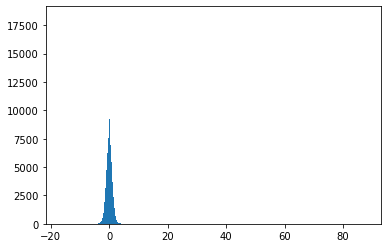

In [589]:
#histSNR=SNR
#histSNR[np.isnan(histSNR)]=0
histogram=plt.hist(SNR.flatten()[~np.isnan(SNR.flatten())], bins='auto')

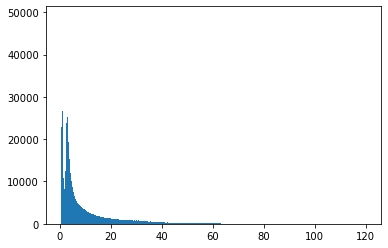

In [590]:
hi=plt.hist(Noise[0,:,:].flatten()[~np.isnan(Noise[0,:,:].flatten())], bins='auto')

Set OBSGEO-B to    19.822878 from OBSGEO-[XYZ].
Set OBSGEO-H to     4120.022 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


WCS Keywords

Number of WCS axes: 3
CTYPE : 'RA---TAN'  'DEC--TAN'  'WAVE'  
CRVAL : 240.305416666667  -0.488333333333333  0.00085  
CRPIX : 533.0  461.0  1.0  
PC1_1 PC1_2 PC1_3  : 1.0  0.0  0.0  
PC2_1 PC2_2 PC2_3  : 0.0  1.0  0.0  
PC3_1 PC3_2 PC3_3  : 0.0  0.0  1.0  
CDELT : -0.00055555555555555  0.00055555555555555  7e-05  
NAXIS : 1031  961  1


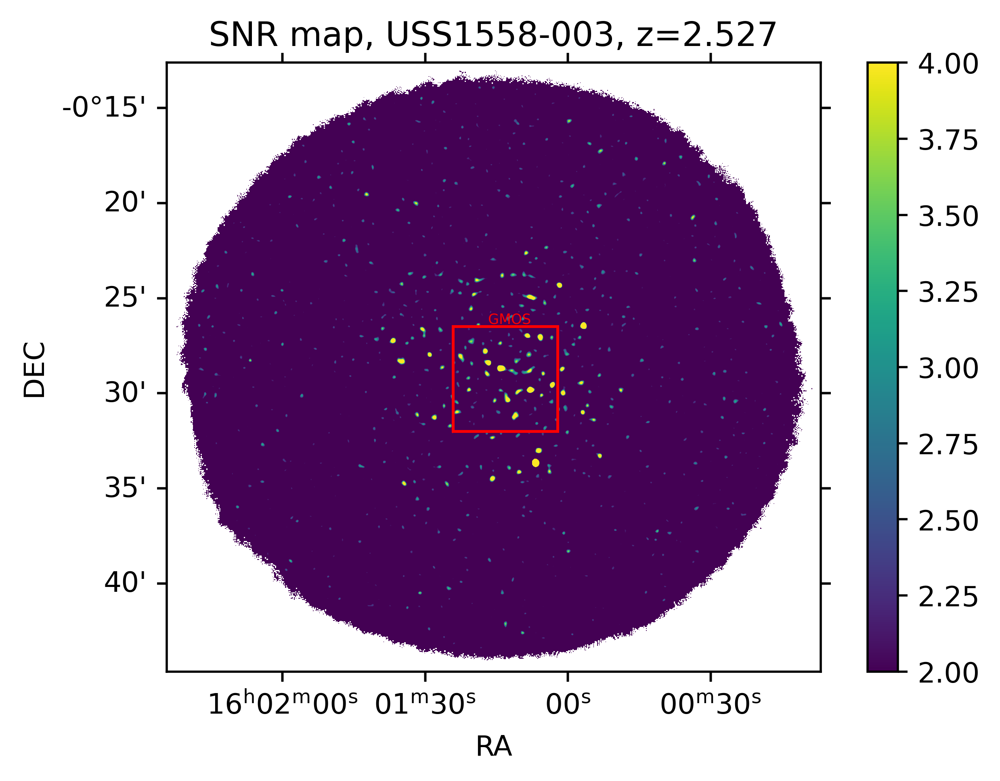

In [591]:
from astropy.wcs import WCS
from astropy.io import fits
from astropy.utils.data import get_pkg_data_filename
histSNR=SNR.flatten()[~np.isnan(SNR.flatten())]

wcs = WCS(hdul[0].header)
print(wcs)
fig=plt.figure(dpi=500)
ax=fig.add_subplot(projection=wcs[0,:,:])
plt.imshow(SNR[0,:,:],vmin=2.,vmax=4., origin='lower')
#plt.imshow(Noise[0,:,:],vmin=3.,vmax=8., origin='lower')
plt.colorbar()
#plt.contour(Noise[0,:,:], levels=[1,2,3,4,5,6,7,8], colors='white',alpha=0.5)#transform=ax.get_transform(WCS(hdul[0].header))
sqrcenter=(hdul[0].header['CRPIX1']-164/2,hdul[0].header['CRPIX2']-164/2)
sqr = plt.Rectangle(sqrcenter, 165, 165,color='r',fill=False)
ax.add_patch(sqr)

ax.text(sqrcenter[0]+55,sqrcenter[1]+170, 'GMOS',color='r', fontsize=5)
#plt.plot(hdul[0].header['CRPIX1'],hdul[0].header['CRPIX2'],'o')
plt.title('SNR map, '+Name+', '+'z='+str(z_obj))
plt.xlabel('RA')
plt.ylabel('DEC')
plt.savefig(os.path.join(spath,'SNR_map_Full_'+Name+'.png'),dpi=500)

# Create radial profile

In [592]:
def azimuthalAverage(image, center=None, stddev=False, returnradii=False, return_nr=False, 
        binsize=0.5, weights=None, steps=False, interpnan=False, left=None, right=None,
        mask=None ):
    """
    Calculate the azimuthally averaged radial profile.
    image - The 2D image
    center - The [x,y] pixel coordinates used as the center. The default is 
             None, which then uses the center of the image (including 
             fractional pixels).
    stddev - if specified, return the azimuthal standard deviation instead of the average
    returnradii - if specified, return (radii_array,radial_profile)
    return_nr   - if specified, return number of pixels per radius *and* radius
    binsize - size of the averaging bin.  Can lead to strange results if
        non-binsize factors are used to specify the center and the binsize is
        too large
    weights - can do a weighted average instead of a simple average if this keyword parameter
        is set.  weights.shape must = image.shape.  weighted stddev is undefined, so don't
        set weights and stddev.
    steps - if specified, will return a double-length bin array and radial
        profile so you can plot a step-form radial profile (which more accurately
        represents what's going on)
    interpnan - Interpolate over NAN values, i.e. bins where there is no data?
        left,right - passed to interpnan; they set the extrapolated values
    mask - can supply a mask (boolean array same size as image with True for OK and False for not)
        to average over only select data.
    If a bin contains NO DATA, it will have a NAN value because of the
    divide-by-sum-of-weights component.  I think this is a useful way to denote
    lack of data, but users let me know if an alternative is prefered...
    
    """
    # Calculate the indices from the image
    y, x = np.indices(image.shape)

    if center is None:
        center = np.array([(x.max()-x.min())/2.0, (y.max()-y.min())/2.0])

    r = np.hypot(x - center[0], y - center[1])

    if weights is None:
        weights = np.ones(image.shape)
    elif stddev:
        raise ValueError("Weighted standard deviation is not defined.")

    if mask is None:
        mask = np.ones(image.shape,dtype='bool')
    # obsolete elif len(mask.shape) > 1:
    # obsolete     mask = mask.ravel()

    # the 'bins' as initially defined are lower/upper bounds for each bin
    # so that values will be in [lower,upper)  
    nbins = int(np.round(r.max() / binsize)+1)
    maxbin = nbins * binsize
    bins = np.linspace(0,maxbin,nbins+1)
    # but we're probably more interested in the bin centers than their left or right sides...
    bin_centers = (bins[1:]+bins[:-1])/2.0

    # how many per bin (i.e., histogram)?
    # there are never any in bin 0, because the lowest index returned by digitize is 1
    #nr = np.bincount(whichbin)[1:]
    nr = np.histogram(r, bins, weights=mask.astype('int'))[0]

    # recall that bins are from 1 to nbins (which is expressed in array terms by arange(nbins)+1 or xrange(1,nbins+1) )
    # radial_prof.shape = bin_centers.shape
    if stddev:
        # Find out which radial bin each point in the map belongs to
        whichbin = np.digitize(r.flat,bins)
        # This method is still very slow; is there a trick to do this with histograms? 
        radial_prof = np.array([image.flat[mask.flat*(whichbin==b)].std() for b in xrange(1,nbins+1)])
    else: 
        radial_prof = np.histogram(r, bins, weights=(image*weights*mask))[0] / np.histogram(r, bins, weights=(mask*weights))[0]

    if interpnan:
        radial_prof = np.interp(bin_centers,bin_centers[radial_prof==radial_prof],radial_prof[radial_prof==radial_prof],left=left,right=right)

    if steps:
        xarr = np.array(zip(bins[:-1],bins[1:])).ravel() 
        yarr = np.array(zip(radial_prof,radial_prof)).ravel() 
        return xarr,yarr
    elif returnradii: 
        return bin_centers,radial_prof
    elif return_nr:
        return nr,bin_centers,radial_prof
    else:
        return radial_prof

(534, 462)
Radius for script is:723.0
733.0


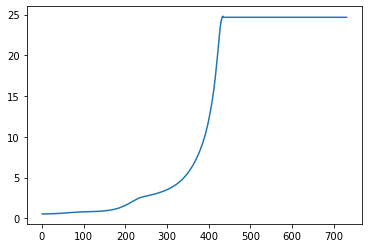

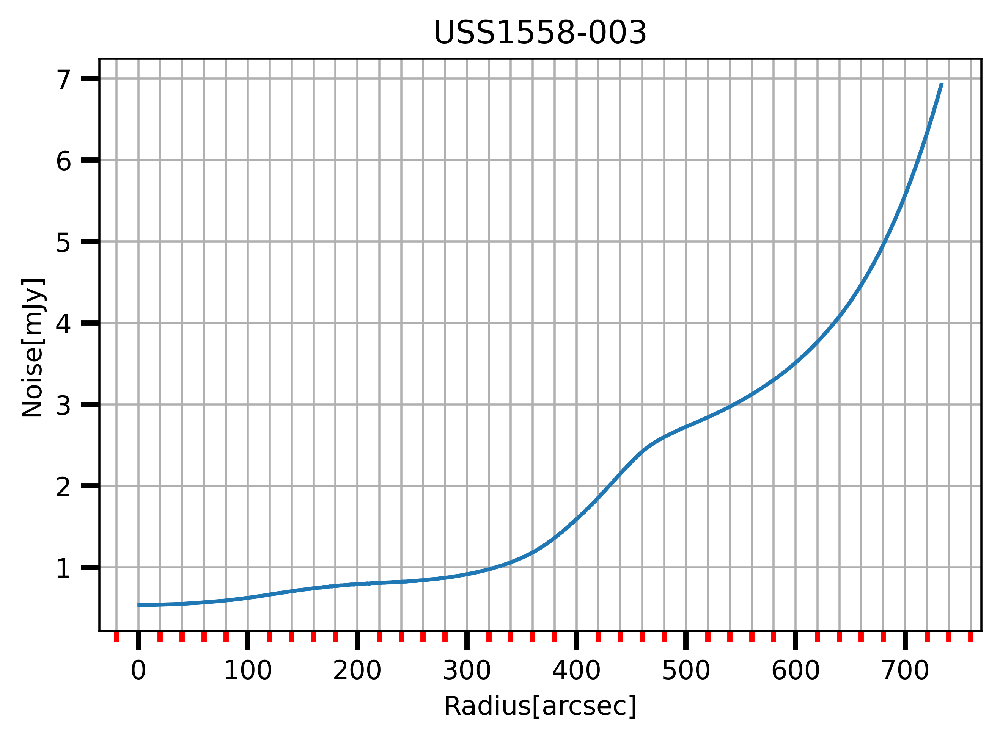

In [593]:
from matplotlib.ticker import AutoMinorLocator

minorLocator = AutoMinorLocator()

img=Noise[0,:,:]
#img[np.isnan(img)] = 0
#wcs = WCS(hdul[0].header)
#center = np.unravel_index(img.argmax(), img.shape)
#print(center)
#center = (-hdul[0].header['LBOUND1']+1, -hdul[0].header['LBOUND2']+1)
center = (int(hdul[0].header['CRPIX1'])+1,int(hdul[0].header['CRPIX2'])+1)
print(center)

#new better approach with 0.1 binsize.
r,rad=azimuthalAverage(img, center=center, stddev=False, returnradii=True, return_nr=False, 
        binsize=1., weights=None, steps=False, interpnan=True, left=None, right=None,
        mask=None )
plt.plot(r,rad)
#print(rad)
#rad[np.isnan(img)] = 0
rad_plot=rad[0:np.argmax(rad)]
r_plot=r[0:np.argmax(rad)]
#print(rad_plot)
rad_plot2=rad_plot[rad_plot<=7.]
r_plot2=r_plot[rad_plot<=7.]
print('Radius for script is:'+str(2*np.max(r_plot2)-10))
print(2*r_plot2[np.argmax(rad_plot2)])
#plt.hist(rad_plot2,bins='auto')

#plot radial profile at 7 mJy cutouff
fig, ax = plt.subplots(dpi=500)
plt.plot(2*r_plot2,rad_plot2)

ax.xaxis.set_minor_locator(minorLocator)

plt.tick_params(which='both', width=2)
plt.tick_params(which='major', length=7)
plt.tick_params(which='minor', length=4, color='r')
#plt.vlines(x=2*np.argmax(rad_profile),ymin=0,ymax=max(rad_profile))
plt.grid()
plt.title(Name)
ax.set_ylabel("Noise[mJy]")
#ax.set_ylabel(hdul[0].header['Label'] + " (" + hdul[0].header['BUNIT'] + ")")
ax.set_xlabel("Radius[arcsec]")
plt.grid(which="minor")
plt.savefig(os.path.join(spath,'Radial_profile_'+Name+'.png'),dpi=500)
plt.show()

# Plot of optical K-band with SNR contours of 850 microns

In [594]:
band='K'
nameSignal=Name+band+'.fits'
if Name == '4C41':
    nameSignal=Name+'.17'+band+'.fits'

pathVIS=r'C:\Users\blue\Desktop\Python\Optical'

hdulVIS = fits.open(os.path.join(pathVIS,nameSignal))

hdulVIS.info()

SNRVIS = hdulVIS[0].data

hdulVIS[0].header

Filename: C:\Users\blue\Desktop\Python\Optical\USS1558-003K.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU     215   (4097, 4097)   float32   


SIMPLE  =                    T / Fits standard                                  
BITPIX  =                  -32 / Bits per pixel                                 
NAXIS   =                    2 / Number of axes                                 
NAXIS1  =                 4097 / Axis length                                    
NAXIS2  =                 4097 / Axis length                                    
EXTEND  =                    F / File may contain extensions                    
ORIGIN  = 'NOAO-IRAF FITS Image Kernel December 2001' / FITS file originator    
OBJECT  = 'uss1558 '           / Name of the object observed                    
DATE    = '2004-07-28T02:23:13'                                                 
IRAF-TLM= '16:34:38 (29/07/2004)'                                               
COM0    = '------------------' / Line break                                     
FILEBASE= 'uss1558_ks'                   / Filename template                    
FILENAME= 'uss1558_ks.0001.f

WCS Keywords

Number of WCS axes: 2
CTYPE : 'RA---TAN'  'DEC--TAN'  
CRVAL : 240.33827941592  -0.476438413663384  
CRPIX : 2073.30857217904  2093.66676627718  
CD1_1 CD1_2  : 1.71494403705004e-07  -4.4054631389547e-05  
CD2_1 CD2_2  : 4.40265420145221e-05  2.31210515056168e-07  
NAXIS : 4097  4097


the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
Changed DATE-OBS from '2004-03-30        ' to '2004-03-30T00:00:00.0''. [astropy.wcs.wcs]


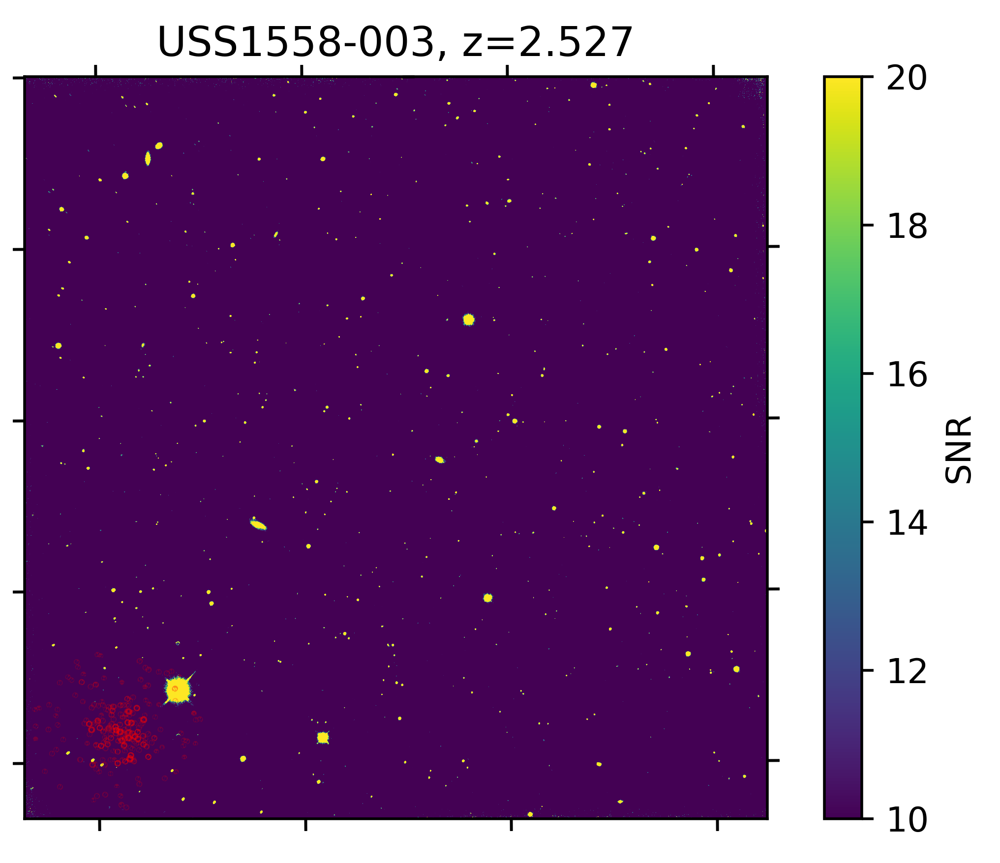

In [595]:
wcsVIS = WCS(hdulVIS[0].header)
print(wcsVIS)
fig=plt.figure(dpi=500)
ax=fig.add_subplot(projection=wcsVIS)#wcs[0,:,:])

ax.contour( SNR[0,:,:], levels=[3,4,5],transform=ax.get_transform(wcsVIS),colors='red',alpha=0.25)

plt.imshow(SNRVIS,vmin=10,vmax=20, origin='lower')

clb = plt.colorbar()
clb.set_label('SNR')


plt.title(Name+', '+'z='+str(z_obj))
plt.xlabel('RA')
plt.ylabel('DEC')
plt.savefig(os.path.join(spath,'SNR_map_K_band'+Name+'.png'),dpi=500)

# Plot of cropped image using radial noise profile 

# Python cutout instead of Picard

In [596]:
#creates circular mask if needed
def create_circular_mask(h, w, center=None, radius=None):

    if center is None: # use the middle of the image
        center = (int(w/2), int(h/2))
    if radius is None: # use the smallest distance between the center and image walls
        radius = min(center[0], center[1], w-center[0], h-center[1])

    Y, X = np.ogrid[:h, :w]
    dist_from_center = np.sqrt((X - center[0])**2 + (Y-center[1])**2)

    mask = dist_from_center <= radius
    return mask

WCS Keywords

Number of WCS axes: 3
CTYPE : 'RA---TAN'  'DEC--TAN'  'WAVE'  
CRVAL : 240.305416666667  -0.488333333333333  0.00085  
CRPIX : 533.0  461.0  1.0  
PC1_1 PC1_2 PC1_3  : 1.0  0.0  0.0  
PC2_1 PC2_2 PC2_3  : 0.0  1.0  0.0  
PC3_1 PC3_2 PC3_3  : 0.0  0.0  1.0  
CDELT : -0.00055555555555555  0.00055555555555555  7e-05  
NAXIS : 1031  961  1
WCS Keywords

Number of WCS axes: 2
CTYPE : 'RA---TAN'  'DEC--TAN'  
CRVAL : 240.305416666667  -0.488333333333333  
CRPIX : 533.0  461.0  
PC1_1 PC1_2  : 1.0  0.0  
PC2_1 PC2_2  : 0.0  1.0  
CDELT : -0.00055555555555555  0.00055555555555555  
NAXIS : 1031  961  1
(534, 462)
WCS Keywords

Number of WCS axes: 2
CTYPE : 'RA---TAN'  'DEC--TAN'  
CRVAL : 240.305416666667  -0.488333333333333  
CRPIX : 360.0  360.0  
PC1_1 PC1_2  : 1.0  0.0  
PC2_1 PC2_2  : 0.0  1.0  
CDELT : -0.00055555555555555  0.00055555555555555  
NAXIS : 723  723


Set MJD-END to 57203.481898 from DATE-END'. [astropy.wcs.wcs]
Set OBSGEO-B to    19.822878 from OBSGEO-[XYZ].
Set OBSGEO-H to     4120.022 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


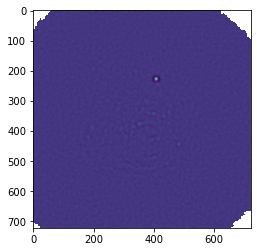

In [597]:
from astropy.nddata import Cutout2D
from astropy import units as u
print(wcs)
cuthdul = fits.open(os.path.join(path,namemfSNR))[0]
cutwcs = WCS(cuthdul.header,naxis=(1,2))
print(cutwcs)
#print(cutwcs)
position = (hdul[0].header['CRPIX1']+1,hdul[0].header['CRPIX2']+1)
print(center)
#WHY DOES THE CUTOUT2D FUNCTION TAKE PIXEL POSITIONS FOR THE CENTER, BUT ARCSEC FOR THE CUTOUT REGION???
cutSNR = Cutout2D(SNR[0,:,:], position, (2*np.max(r_plot2)-10, 2*np.max(r_plot2)-10), wcs=cutwcs)
cutmfsignal = Cutout2D(mfsignal[0,:,:], position, (2*np.max(r_plot2)-10, 2*np.max(r_plot2)-10), wcs=cutwcs)
cutNoise = Cutout2D(Noise[0,:,:], position, (2*np.max(r_plot2)-10, 2*np.max(r_plot2)-10),wcs=cutwcs)
plt.imshow(cutSNR.data)

print(cutSNR.wcs)

In [598]:
#print(str(cutSNR.wcs)[112:138])
from astropy.wcs import utils
cutnum=[215,360,303,350,353,328,340,355,60,353,344,324]
#cutnum=324#take this from the CRPIX in the 2 axis wcs
cutcenter=(cutnum[num],cutnum[num])
#pixel_scale = utils.proj_plane_pixel_area(cutwcs)
#print(pixel_scale)
#print('CRPIX: ', cutSNR.wcs.crpix)

356.5


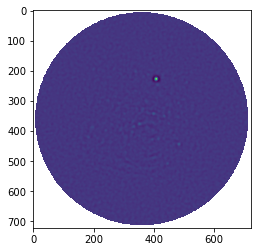

In [599]:
h, w = len(cutSNR.data[:,0]),len(cutSNR.data[0,:])
radius = r_plot2[np.argmax(rad_plot2)]-10
print(radius)
mask = create_circular_mask(h, w, center=cutcenter,radius=radius)
cSNR = cutSNR.data.copy()
cSNR[~mask] = float('NaN')
data = cSNR
plt.imshow(cSNR)

cmfsignal = cutmfsignal.data.copy()
cmfsignal[~mask] = float('NaN') 

cNoise=cutNoise.data.copy()
cNoise[~mask] = float('NaN')


In [600]:
from astropy.stats import sigma_clipped_stats
from photutils.datasets import make_100gaussians_image
from photutils import find_peaks
from astropy.visualization import simple_norm
from astropy.visualization.mpl_normalize import ImageNormalize
from photutils import CircularAperture

data = cSNR
#mean, median, std = sigma_clipped_stats(data, sigma=3.0)
#print(mean,median,std)
threshold = 4.0#median + (4. * std)
tbl = find_peaks(data, threshold, box_size=11)
tbl['peak_value'].info.format = '%.8g'  # for consistent table output
tbl # print peaks

x_peak,y_peak,peak_value
int64,int64,float64
201,195,4.9657005
340,204,6.3996851
382,214,5.3744563
430,214,4.2059465
408,228,87.724139
509,239,6.081952
413,248,7.0251876
340,268,4.2890884
500,296,4.1595651


In [601]:
# Define a class that forces representation of float to look a certain way
# This remove trailing zero so '1.0' becomes '1'
class nf(float):
    def __repr__(self):
        s = f'{self:.1f}'
        return f'{self:.0f}' if s[-1] == '0' else s

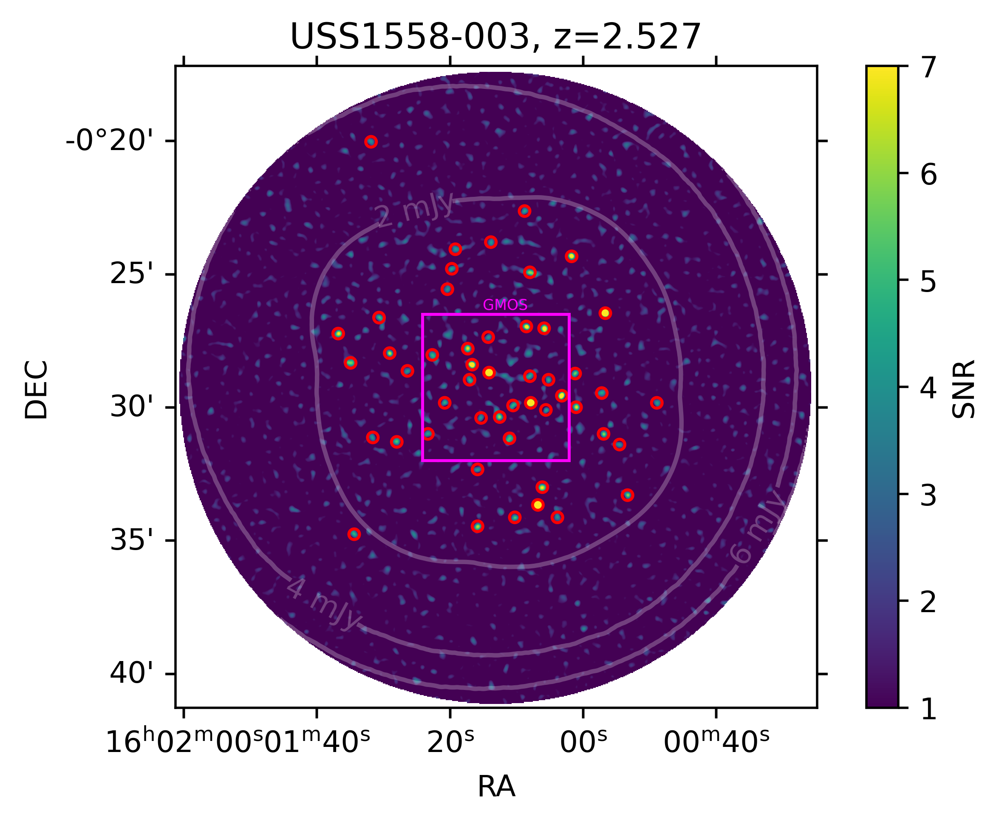

In [602]:
#Define figure
fig=plt.figure(dpi=500)
ax=fig.add_subplot(projection=cutSNR.wcs)
if max(cSNR[~np.isnan(cSNR)])< 7.:
    plt.imshow(cSNR,vmin=1.,vmax=max(cSNR[~np.isnan(cSNR)]), origin='lower')
else:
    plt.imshow(cSNR,vmin=1.,vmax=7., origin='lower')
#Plot circles around objects with SNR>4
positions = np.transpose((tbl['x_peak'], tbl['y_peak']))
apertures = CircularAperture(positions, r=6.)
apertures.plot(color='red', lw=1.0)

#colorbar
clb = plt.colorbar()
clb.set_label('SNR')

#Noise contours
CS=plt.contour(cNoise, levels=[2,4,6,8,10,12,14,16], colors='white',alpha=0.25)#, transform=ax.get_transform(wcs[0,:,:])
if plt.rcParams["text.usetex"]:
    fmt = r'%r mJy'
else:
    fmt = '%r mJy'
CS.levels = [nf(val) for val in CS.levels]
plt.clabel(CS, CS.levels, inline=True, fmt=fmt, fontsize=10)

#GMOS square 
#This is from the center of the object
sqrcenter=(cutcenter[0]-164/2,cutcenter[1]-164/2)
#The rest here is given by GMOS specs
sqr = plt.Rectangle(sqrcenter, 165, 165,color='magenta',fill=False)
ax.add_patch(sqr)
ax.text(sqrcenter[0]+68,sqrcenter[1]+170, 'GMOS',color='magenta', fontsize=5)

#Plot stuff
plt.title(Name+', '+'z='+str(z_obj))
plt.xlabel('RA')
plt.ylabel('DEC')
plt.savefig(os.path.join(spath,'SNR_map_cutout_'+Name+'.png'),dpi=500)

In [611]:
#print(positions)
# object ID is the first entry
m_k=[0]*len(tbl['x_peak'])#comes from source Extraction 
cat=[0]*len(tbl['x_peak'])
#cat is set up as [ID, alpha of source, delta of source, mag in K band]
for i in range(0,len(tbl['x_peak'])):
    cat[i]=[i,2*tbl['x_peak'][i], 2*tbl['y_peak'][i],m_k[i]]#can we just multiply by 2 to get the arcsec position?
print(len(cat))

49


# Create post stamp cutouts for each source

<ipython-input-615-283c0c178e14>:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig=plt.figure(dpi=500)
<ipython-input-615-283c0c178e14>:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig=plt.figure(dpi=500)
<ipython-input-615-283c0c178e14>:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig=plt.figure(dpi=500)
<ipytho

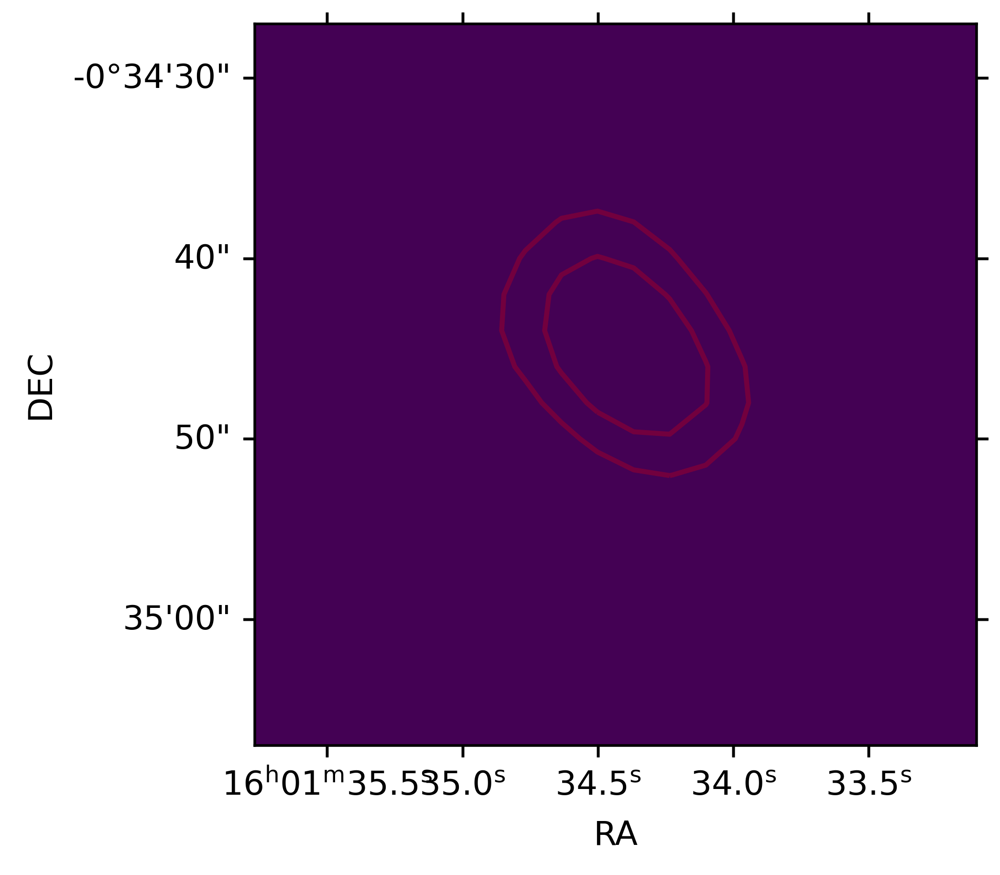

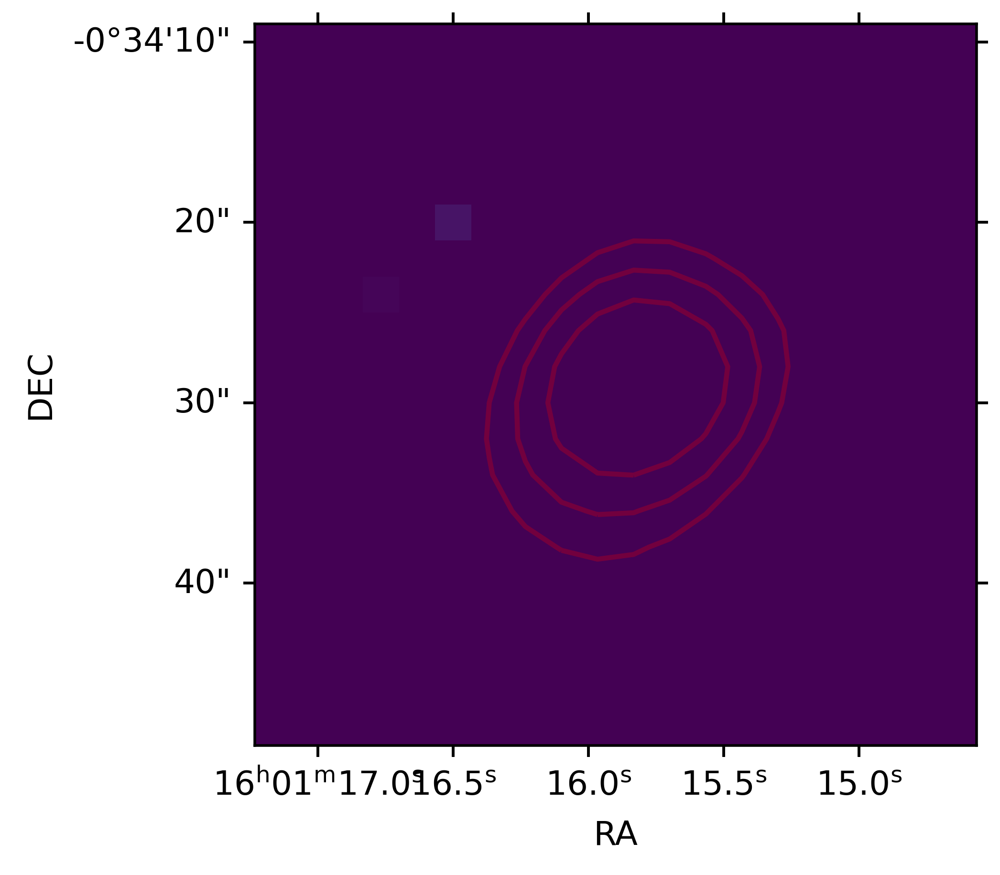

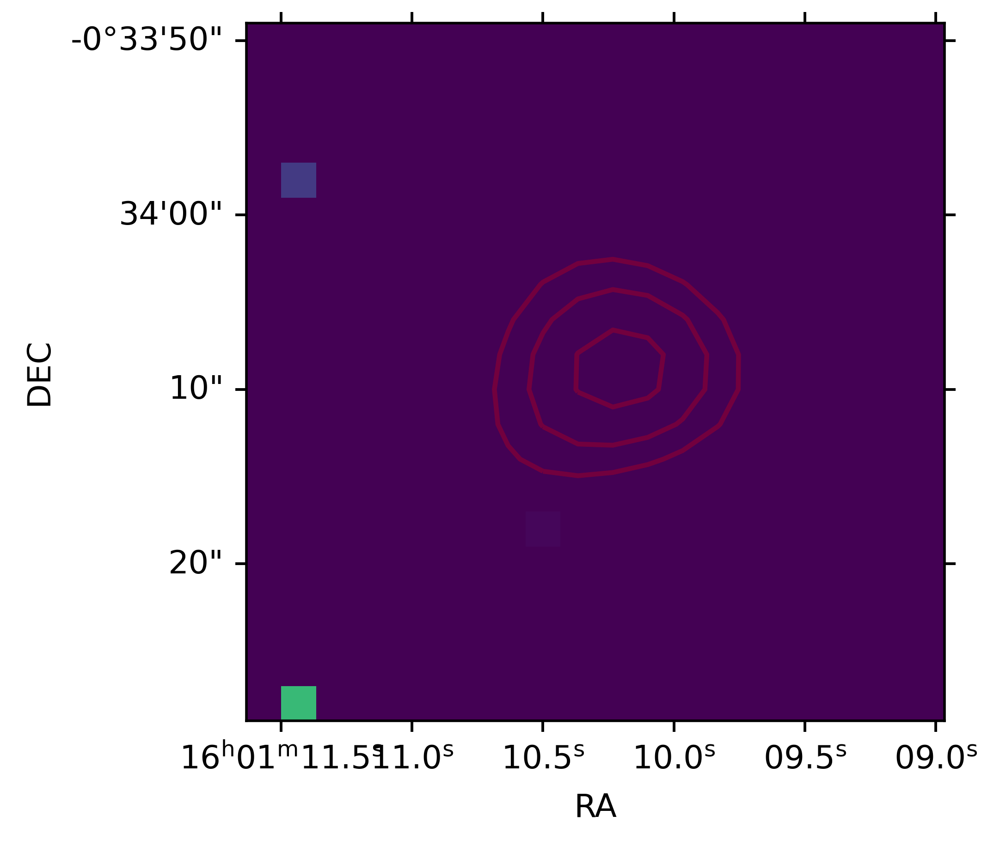

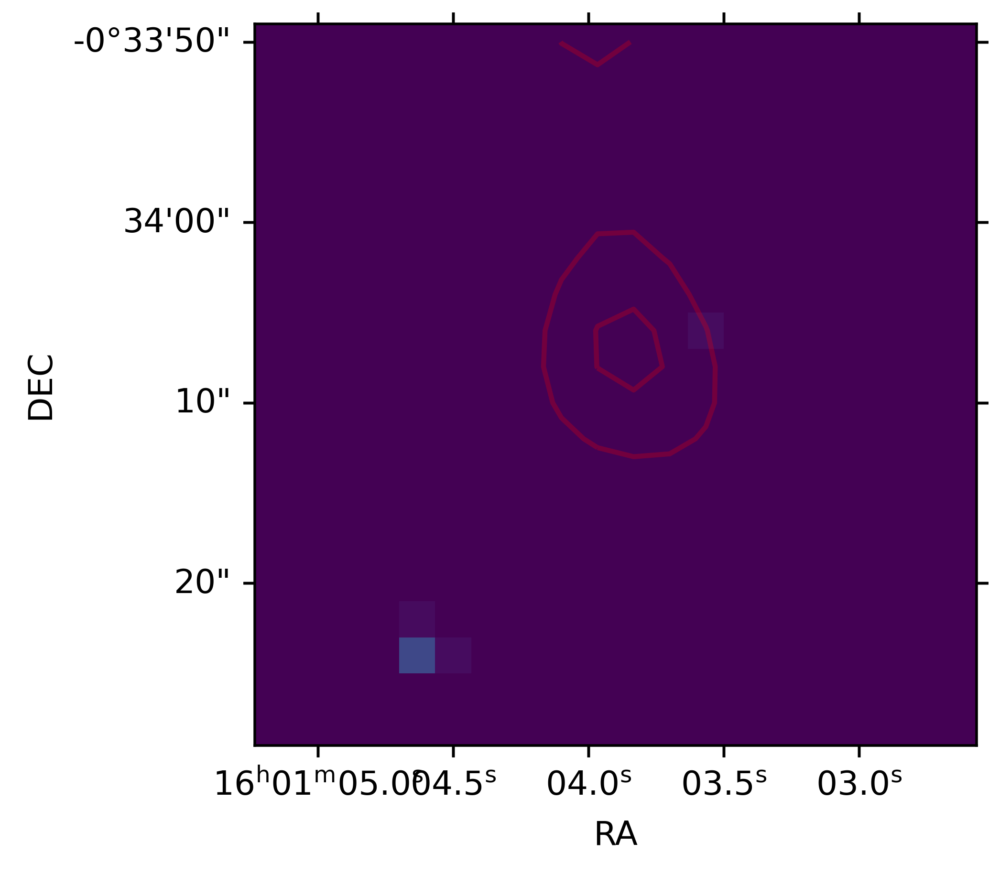

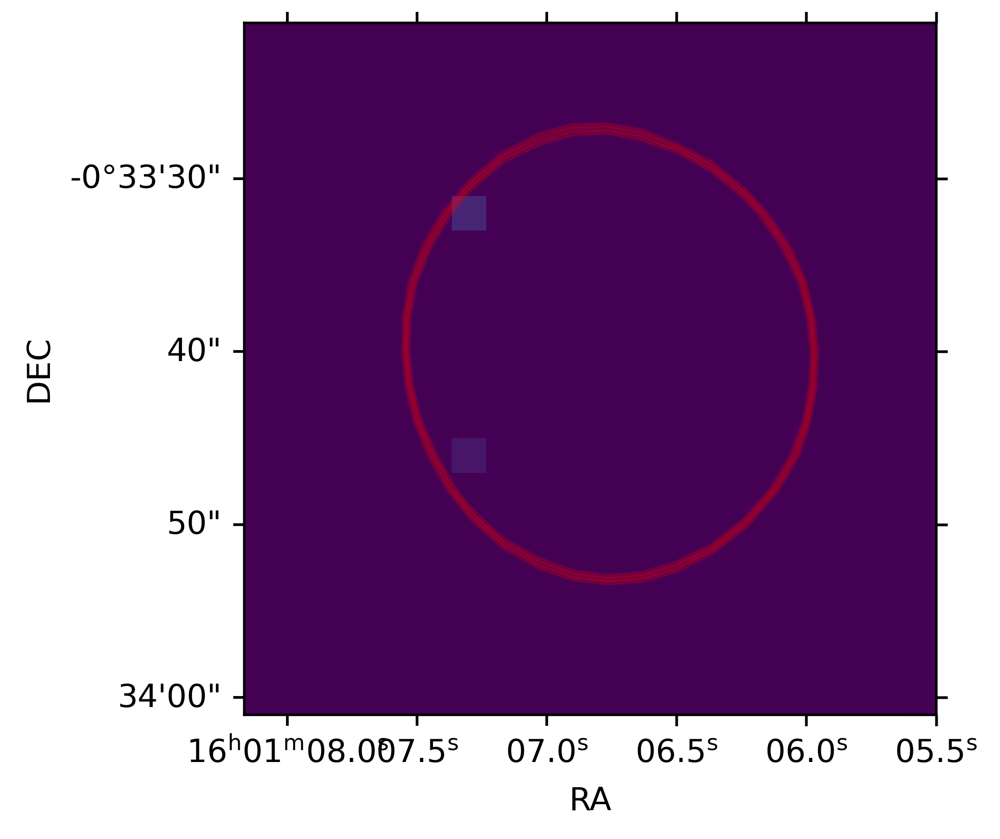

...

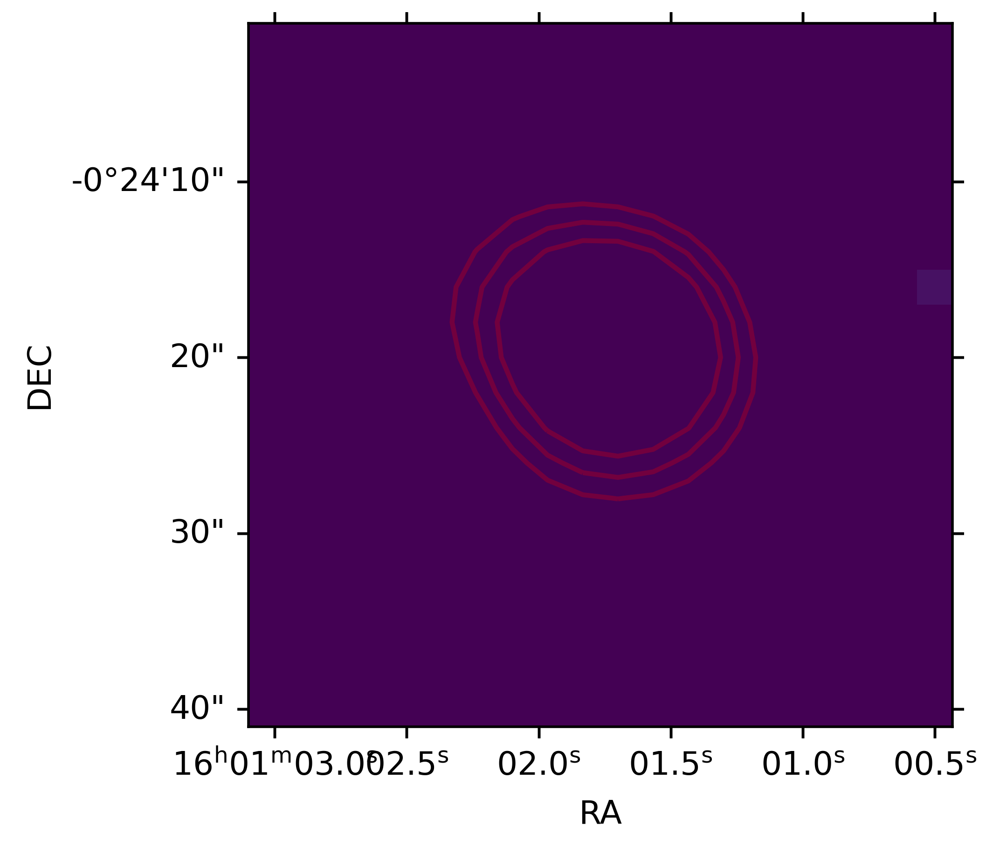

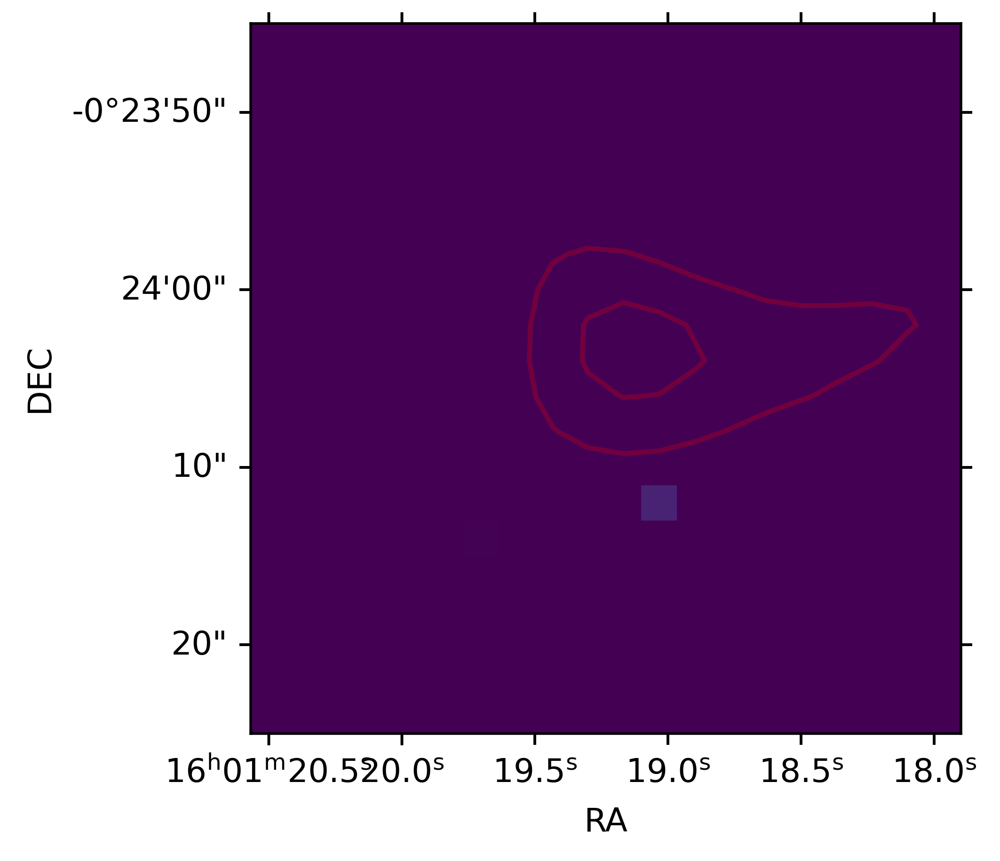

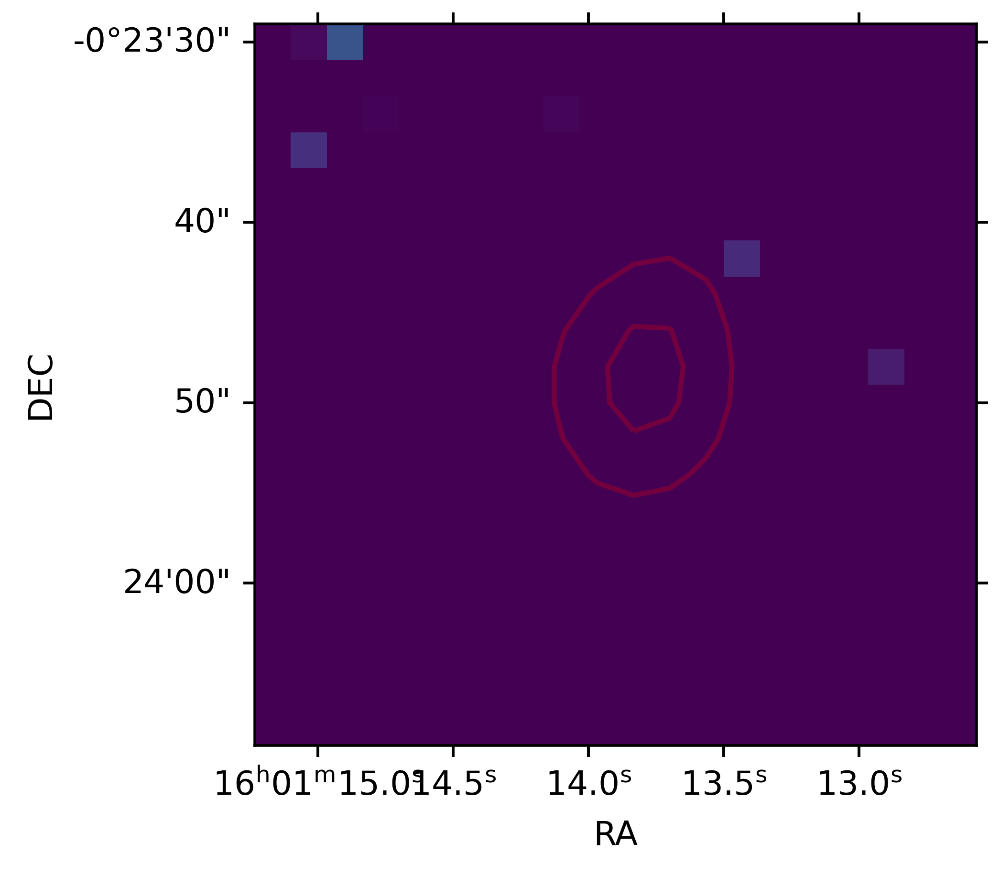

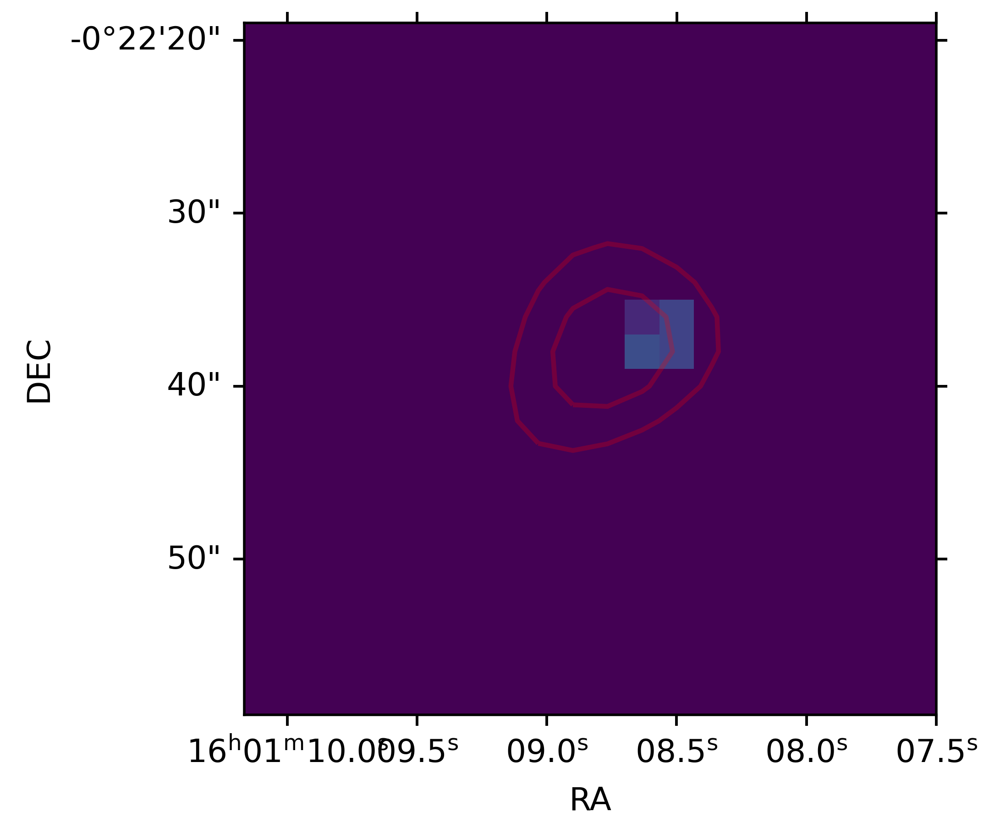

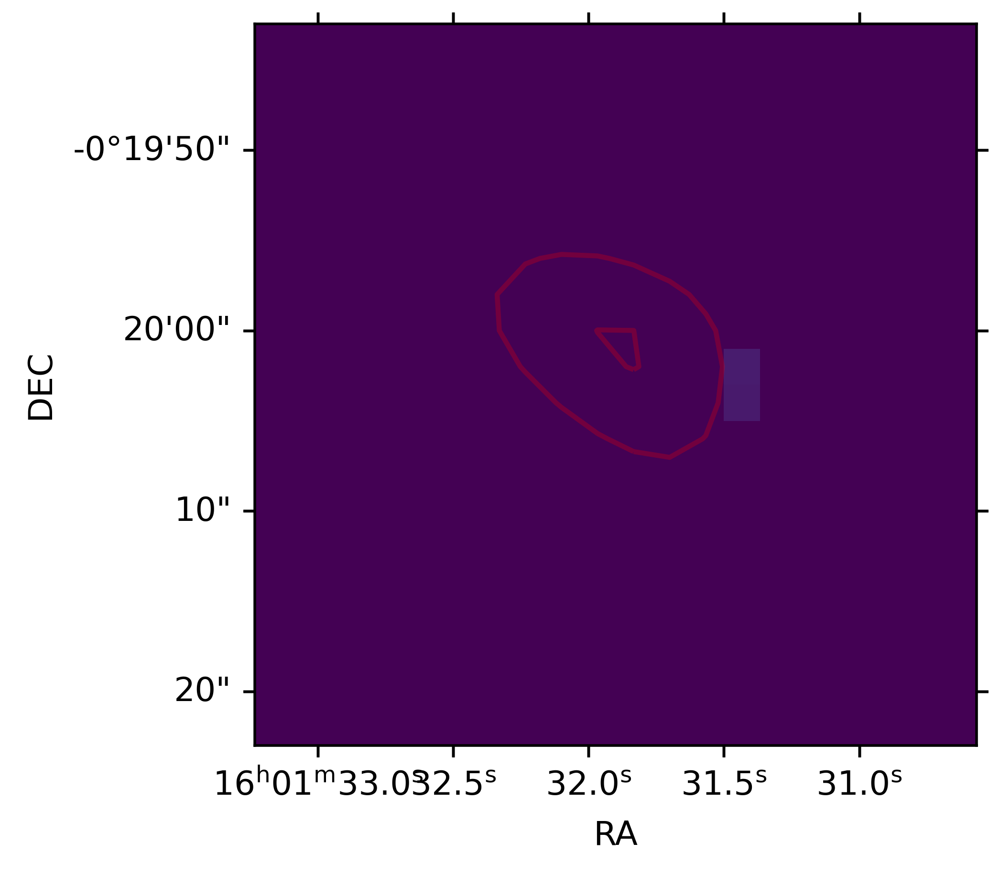

In [615]:
#REMEMBER TO CUT THE OPTICAL AND PLOT SCUBA CONTOURS ON TOP
for i in range(0,len(cat)):
    postSNR = Cutout2D(cutSNR.data, [tbl['x_peak'][i], tbl['y_peak'][i]],(20,20), wcs=cutSNR.wcs)
    postSNRVIS = Cutout2D(SNRVIS, [tbl['x_peak'][i], tbl['y_peak'][i]],(20,20), wcs=cutSNR.wcs)


    #postmfsignal = Cutout2D(mfsignal[0,:,:], position, (2*np.max(r_plot2)-10, 2*np.max(r_plot2)-10), wcs=cutwcs)
    #postNoise = Cutout2D(Noise[0,:,:], position, (2*np.max(r_plot2)-10, 2*np.max(r_plot2)-10),wcs=cutwcs)
    fig=plt.figure(dpi=500)
    ax=fig.add_subplot(projection=postSNR.wcs)

    ax.contour( postSNR.data, levels=[3,4,5],transform=ax.get_transform(postSNRVIS.wcs),colors='red',alpha=0.25)

    plt.imshow(postSNRVIS.data,vmin=10,vmax=20, origin='lower')

    #plt.imshow(postSNR.data,vmin=1.,vmax=7., origin='lower')
    plt.xlabel('RA')
    plt.ylabel('DEC')
    #print(postSNR.wcs)
    #print(postSNRVIS.wcs)

# Histogram fitting and extra plots 

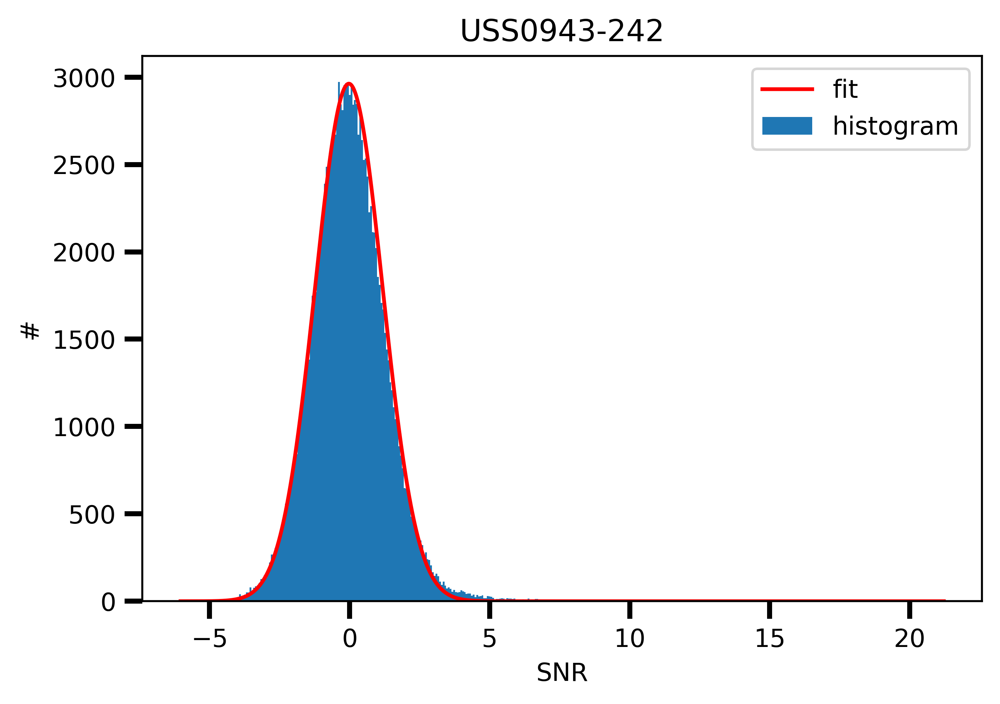

In [214]:
#Fit to SNR histogram
from astropy.modeling import models, fitting

histcSNR=cSNR.flatten()[~np.isnan(cSNR.flatten())]

bin_heights, bin_borders = np.histogram(histcSNR,bins="auto")
bin_widths = np.diff(bin_borders)
bin_centers = bin_borders[:-1] + bin_widths / 2

t_init = models.Gaussian1D()
fit_t = fitting.LevMarLSQFitter()
t = fit_t(t_init, bin_centers[bin_centers<0], bin_heights[bin_centers<0])#fits only the negative half

x_interval_for_fit = np.linspace(bin_borders[0], bin_borders[-1], 10000)
plt.figure(dpi=500)
plt.title(Name)
plt.tick_params(which='both', width=2)
plt.tick_params(which='major', length=7)
plt.tick_params(which='minor', length=4, color='r')
plt.bar(bin_centers, bin_heights, width=bin_widths, label='histogram')
plt.plot(x_interval_for_fit, t(x_interval_for_fit), label='fit', c='red')
plt.xlabel('SNR')
plt.ylabel('#')
plt.legend()
plt.savefig(os.path.join(spath,'SNR_hist_'+Name+'.png'),dpi=500)

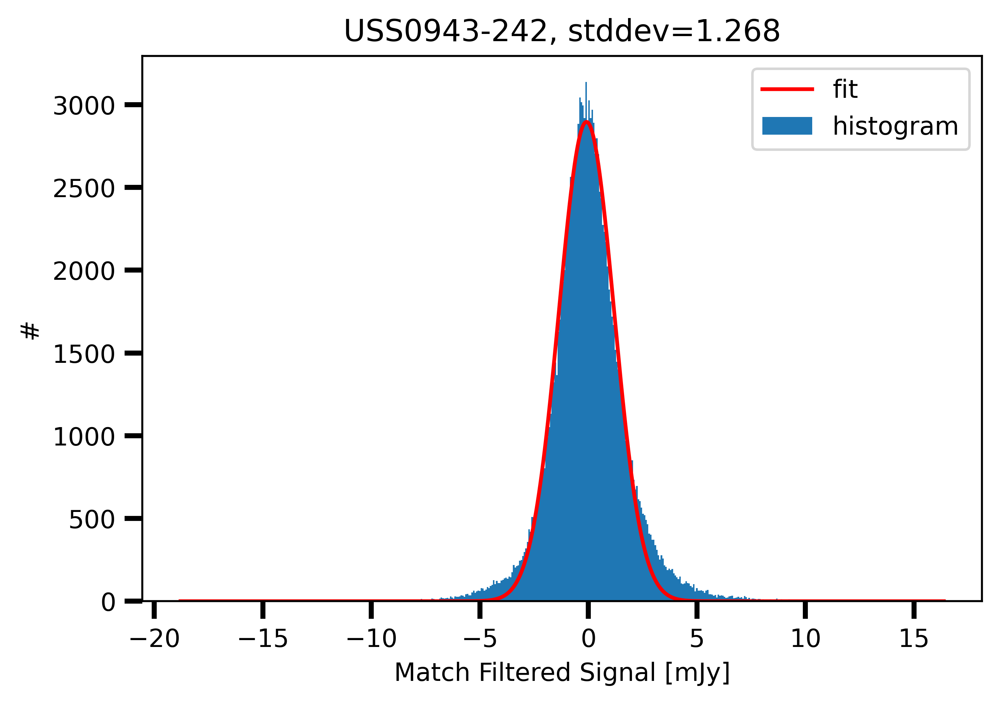

In [215]:
#fit to Match Filtered signal to obtain stddev which tells us about noise. 
histcmfSignal=cmfsignal.flatten()[~np.isnan(cmfsignal.flatten())]

bin_heights, bin_borders = np.histogram(histcmfSignal,bins="auto")
bin_widths = np.diff(bin_borders)
bin_centers = bin_borders[:-1] + bin_widths / 2

t_init = models.Gaussian1D()
fit_t = fitting.LevMarLSQFitter()
t = fit_t(t_init, bin_centers[bin_centers<3], bin_heights[bin_centers<3])#fits only the negative half
a_float = t.stddev[0]
f_float = "{:.3f}".format(a_float)
x_interval_for_fit = np.linspace(bin_borders[0], bin_borders[-1], 10000)
plt.figure(dpi=500)
plt.title(Name+', stddev='+str(f_float))
plt.tick_params(which='both', width=2)
plt.tick_params(which='major', length=7)
plt.tick_params(which='minor', length=4, color='r')
plt.bar(bin_centers, bin_heights, width=bin_widths, label='histogram')
plt.plot(x_interval_for_fit, t(x_interval_for_fit), label='fit', c='red')
plt.xlabel('Match Filtered Signal [mJy]')
plt.ylabel('#')
plt.legend()
plt.savefig(os.path.join(spath,'mfcal_hist_'+Name+'.png'),dpi=500)

# Extra plots

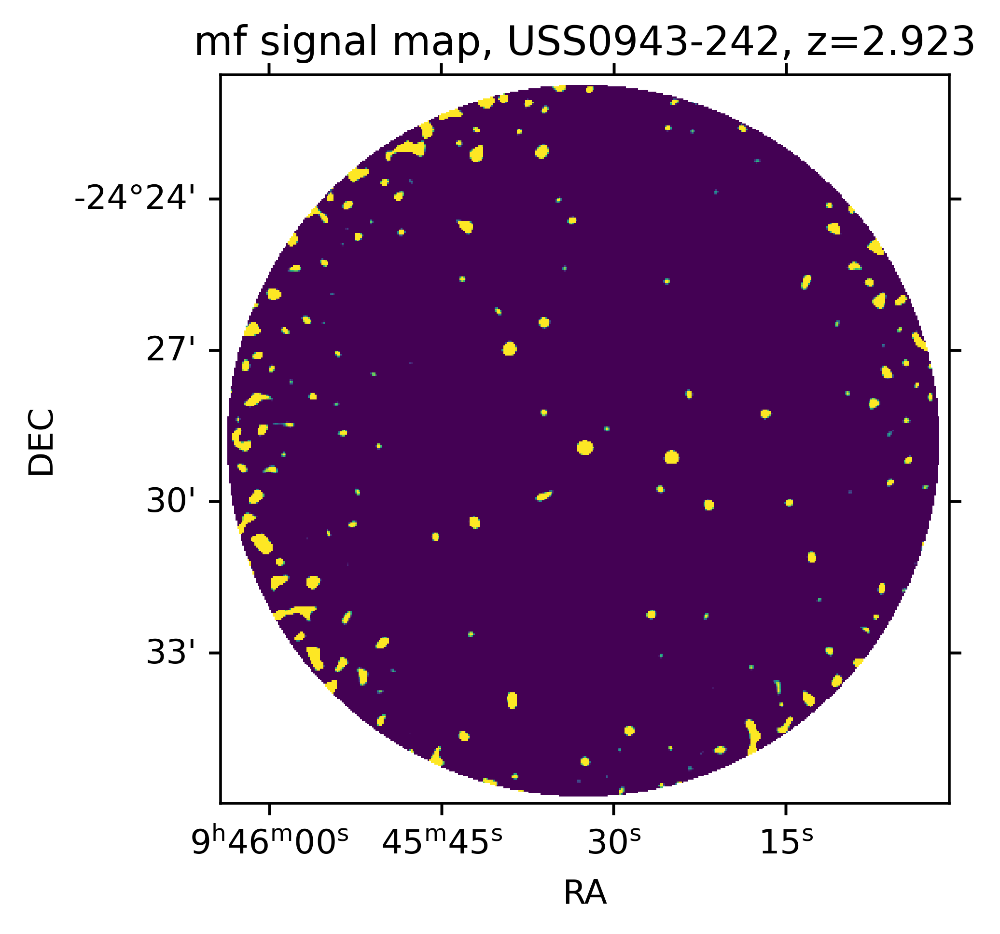

In [31]:
plt.figure(dpi=500)
plt.subplot(projection=cutSNR.wcs)
plt.imshow(cmfsignal,vmin=3.5,vmax=4., origin='lower')

plt.title('mf signal map, '+Name+', '+'z='+str(z_obj))
plt.xlabel('RA')
plt.ylabel('DEC')

NameError: name 'cSignal' is not defined

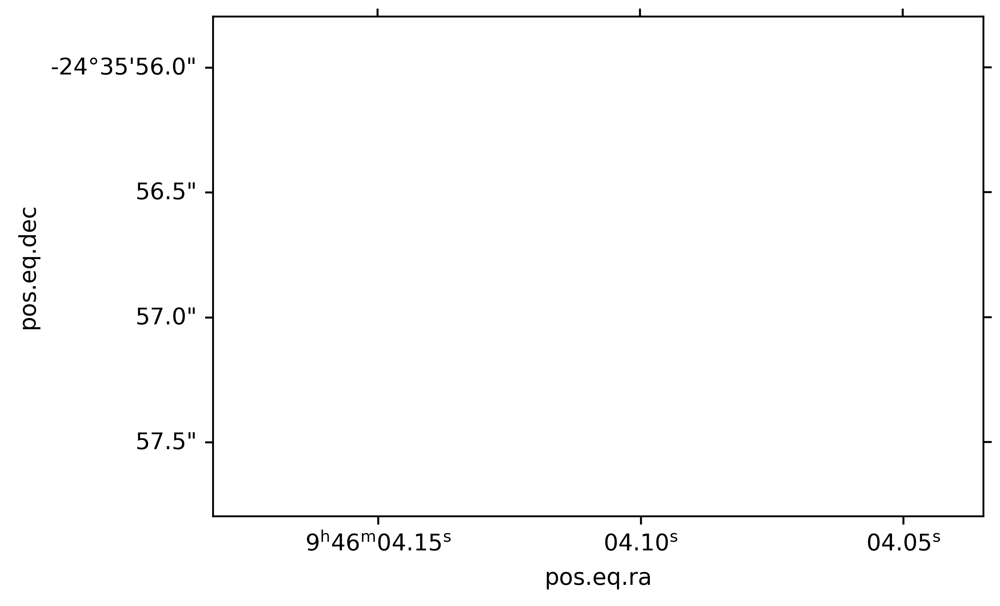

In [32]:
plt.figure(dpi=500)
plt.subplot(projection=cutSNR.wcs)
plt.imshow(cSignal, origin='lower')

plt.title('Signal map, '+Name+', '+'z='+str(z_obj))
plt.xlabel('RA')
plt.ylabel('DEC')

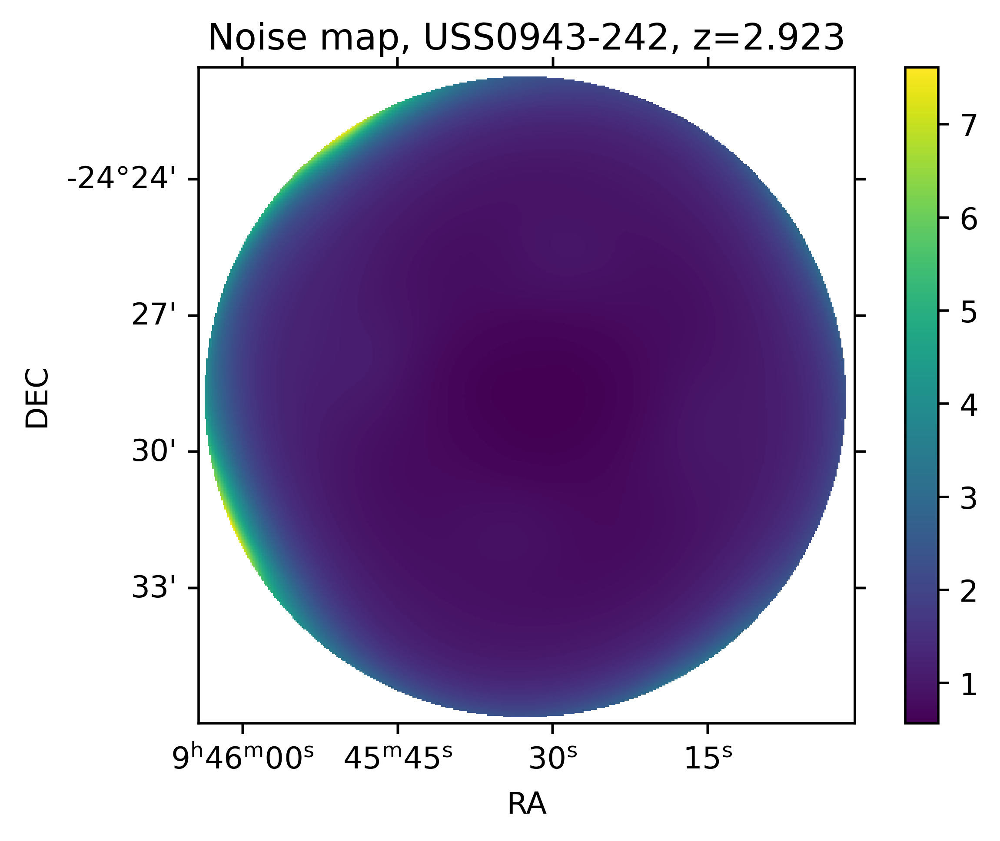

In [33]:
plt.figure(dpi=500)
plt.subplot(projection=cutSNR.wcs)
plt.imshow(cNoise, origin='lower')
plt.colorbar()
plt.title('Noise map, '+Name+', '+'z='+str(z_obj))
plt.xlabel('RA')
plt.ylabel('DEC')

# 2D noise modelling

8.185963905108922


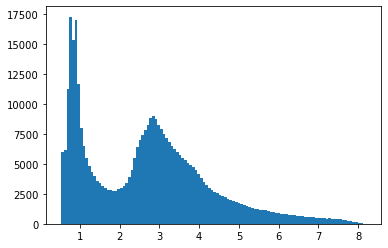

In [17]:

hit=plt.hist(cNoise.flatten()[~np.isnan(cNoise.flatten())], bins='auto')

print(np.max(cNoise.flatten()[~np.isnan(cNoise.flatten())]))

8.185963905108922


C:\Users\blue\anaconda3\lib\site-packages\numpy\lib\histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
C:\Users\blue\anaconda3\lib\site-packages\numpy\lib\histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


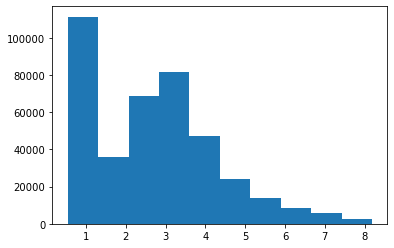

In [18]:
y,x = np.mgrid[:len(cNoise[:,0]), :len(cNoise[0,:])]#np.mgrid[:978, :1087]
z = cNoise.copy()
plt.hist(z.flatten())
#print(np.max(z.flatten()))
z[np.isnan(z)]=0#max(rad_plot2)
print(np.max(z.flatten()))
z[z==0]=np.max(z.flatten())

In [19]:
import warnings


#print(z)

# Fit the data using astropy.modeling
p_init = models.Polynomial2D(degree=14)#Hermite2D(x_degree=8,y_degree=8)#Legendre2D(x_degree=8,y_degree=8)#Chebyshev2D(x_degree=8,y_degree=8)
fit_p = fitting.LevMarLSQFitter()

with warnings.catch_warnings():
    # Ignore model linearity warning from the fitter
    warnings.simplefilter('ignore')
    p = fit_p(p_init, x, y, z)
print('DONE')

DONE


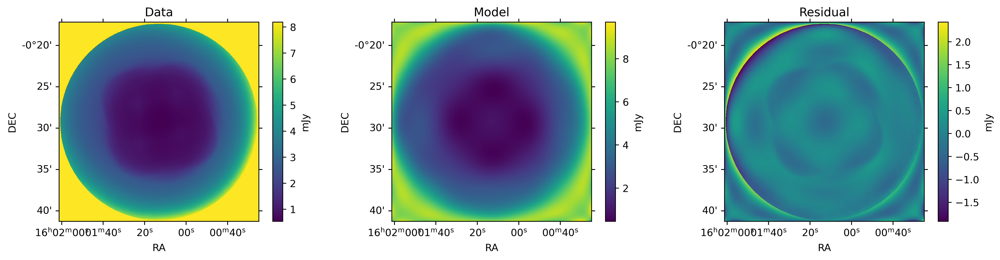

In [20]:
# Plot the data with the best-fit model
plt.figure(dpi=500, figsize=(17, 3.7))
plt.subplot(1, 3, 1,projection=cutSNR.wcs)
plt.imshow(z, origin='lower', interpolation='nearest', vmin=np.min(z), vmax=np.max(z))
clb = plt.colorbar()
clb.set_label('mJy')#, labelpad=-17, y=1.1, rotation=0)
plt.xlabel('RA')
plt.ylabel('DEC')
plt.title("Data")
plt.subplot(1, 3, 2,projection=cutSNR.wcs)
plt.imshow(p(x, y), origin='lower', interpolation='nearest', vmin=np.min(p(x,y)), vmax=np.max(p(x,y)))
plt.title("Model")
plt.xlabel('RA')
plt.ylabel('DEC')
clb = plt.colorbar()
clb.set_label('mJy')#, labelpad=-17, y=1.1, rotation=0)
plt.subplot(1, 3, 3,projection=cutSNR.wcs)
plt.imshow(z - p(x, y), origin='lower', interpolation='nearest', vmin=np.min(z - p(x, y)),
           vmax=np.max(z - p(x, y)))
clb = plt.colorbar()
clb.set_label('mJy')#, labelpad=-42, y=1.1, rotation=0)
plt.title("Residual")
plt.xlabel('RA')
plt.ylabel('DEC')
plt.savefig(os.path.join(spath,'Noise_model_'+Name+'.png'),dpi=500)

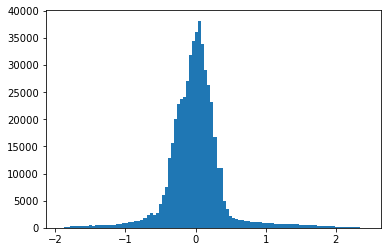

In [23]:
hist=plt.hist((z - p(x, y)).flatten(),bins=100)

<ipython-input-6-59d4cdaac059>:70: RuntimeWarning: invalid value encountered in true_divide
  radial_prof = np.histogram(r, bins, weights=(image*weights*mask))[0] / np.histogram(r, bins, weights=(mask*weights))[0]


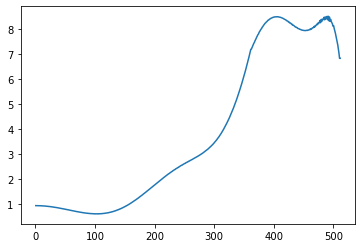

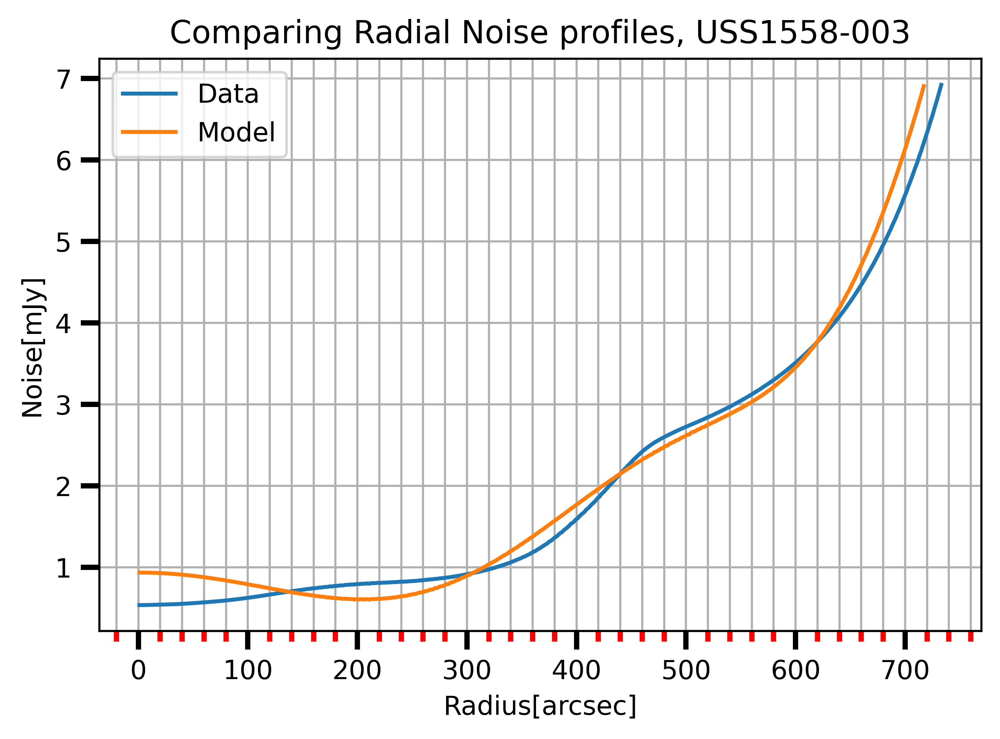

In [24]:
imgm=p(x, y)

centerm = cutcenter#(hdu[0].header['CRPIX1']+1, hdu[0].header['CRPIX2']+1)

rm,radm=azimuthalAverage(imgm, center=None, stddev=False, returnradii=True, return_nr=False, 
        binsize=1.0, weights=None, steps=False, interpnan=True, left=None, right=None,
        mask=None )
plt.plot(rm,radm)

rad_plotm=radm[0:np.argmax(radm)]
r_plotm=rm[0:np.argmax(radm)]

rad_plot2m=rad_plotm[rad_plotm<=7.]
r_plot2m=r_plotm[rad_plotm<=7.]

#plot radial profile at 7 mJy cutouff
fig, ax = plt.subplots(dpi=500)

plt.plot(2*r_plot2,rad_plot2,label='Data')
plt.plot(2*r_plot2m,rad_plot2m,label='Model')
ax.xaxis.set_minor_locator(minorLocator)

plt.tick_params(which='both', width=2)
plt.tick_params(which='major', length=7)
plt.tick_params(which='minor', length=4, color='r')
plt.grid()
plt.title('Comparing Radial Noise profiles, '+Name)
ax.set_ylabel("Noise[mJy]")
ax.set_xlabel("Radius[arcsec]")
plt.grid(which="minor")
plt.legend()
plt.savefig(os.path.join(spath,'Compare_Radial_profiles_'+Name+'.png'),dpi=500)
plt.show()